# Practical 1 - Signal Representations and Noisy Mixtures

[Nasser-eddine Monir](https://nasseredd.github.io/teaching/) (CC BY-NC-SA) -- 2024

* 👥 You may work in pairs,
* 📩 however, submit your work individually by the end of the class.
* 📩 (Optional) Second submission due by Friday, December 27th, 2024, at 11:59 PM.
* 📝 Your names should be included in the file names as follows: **Practical-1-Monir.ipynb**.
* 📧 Please ensure you email me EXCLUSIVELY at the following address: nasser-eddine.monir@inria.fr

# Imports

In [74]:
import librosa
import numpy as np
import seaborn as sns
import librosa.display
import matplotlib.pyplot as plt

# Audio Representations

* Download the `test-clean.tar.gz` from [Librispeech](https://www.openslr.org/12) and save it in `data/`.

**Loading an Audio**

* Load the audio `LibriSpeech/test-clean/61/70968/61-70968-0000.flac` using `librosa` in `speech` variable.
* Print the shape of the signal and the sample rate.

In [75]:
# TODO: code me
speech, sr = librosa.load('data/test-clean/LibriSpeech/test-clean/61/70968/61-70968-0000.flac')
print(f"The shape of the speech is {speech.shape}")
print(f"The sample rate of the speech is {sr}")


The shape of the speech is (108156,)
The sample rate of the speech is 22050


**Display the Audio**

In [76]:
from IPython.display import Audio
Audio(speech, rate=sr)

**Waveform**

* Compute the duration of the speech signal by dividing its total number of samples by the sampling rate.
* Generate a time axis for the waveform using `np.linspace()` to create evenly spaced time points over the duration of the signal.

The duration of the speech is 4.905034013605442 seconds


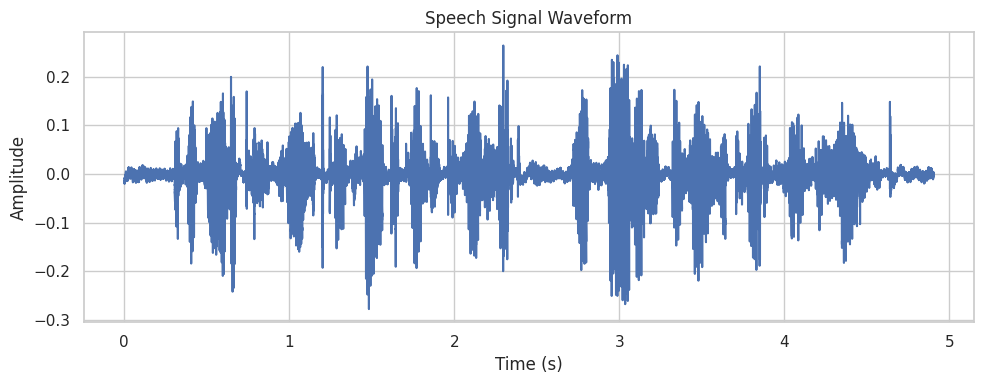

In [77]:
# Define the duration
# TODO: code me
duration = len(speech) / sr
print(f"The duration of the speech is {duration} seconds")

# Create a time axis for the waveform
# TODO: code me
time_axis = np.linspace(0, duration, len(speech))
# Plot the waveform using seaborn
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.lineplot(x=time_axis, y=speech)
plt.title("Speech Signal Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

**Spectrum**
* Define a function `compute_spectrum` that takes a signal.
* Compute the FFT of the signal using `np.fft.fft()`.
* Generate the frequency values using `np.fft.fftfreq()`.
* Identify indices corresponding to positive frequencies using `frequencies > 0`.
* Extract positive frequencies using the indices.
* Compute the magnitudes of the positive FFT results using `np.abs()`.
* Return the positive frequencies and magnitudes as outputs.

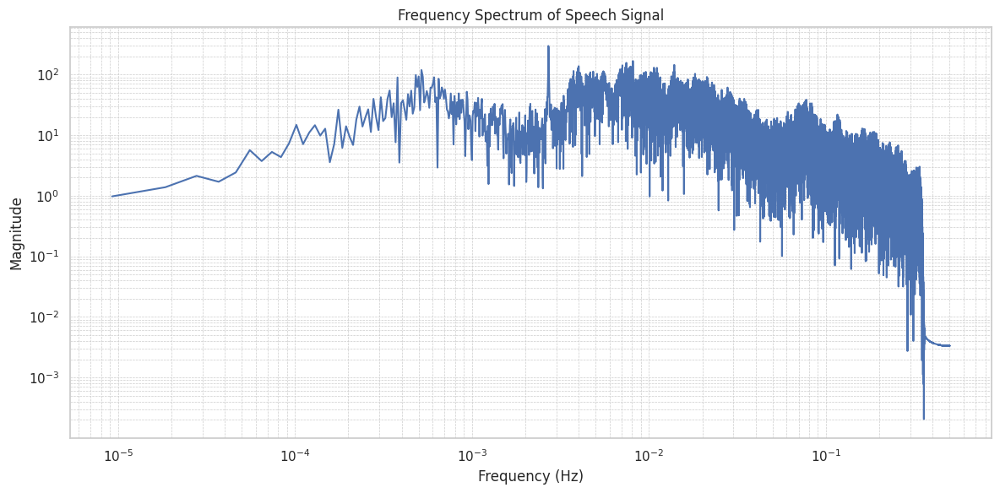

In [78]:
def compute_spectrum(signal):
    """
    Compute the spectrum of an audio file.
    """
    # Compute the Spectrum (Fourier Transform)
    # TODO: code me
    spectrum = np.fft.fft(signal)
    frequencies = np.fft.fftfreq(len(spectrum))

    positive = frequencies > 0

    # Only keep the positive frequencies (single-sided spectrum)
    # TODO: code me
    positive_frequencies = frequencies[positive]
    positive_magnitudes = np.abs(spectrum[positive])
    # positive_magnitudes = np.abs(positive_frequencies)
  

    return positive_frequencies, positive_magnitudes

# Compute Spectrum
positive_frequencies, positive_magnitudes = compute_spectrum(speech)

# Plot the Spectrum on a Logarithmic Scale
plt.figure(figsize=(12, 6))
plt.loglog(positive_frequencies, positive_magnitudes)
plt.title('Frequency Spectrum of Speech Signal')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

**Spectrogram**

* Define a function `compute_stft_magnitude` with parameters signal, n_fft (1024), hop_length (=n_fft // 4 for 75% overlap), and window (default 'hann').
* Compute the STFT of the signal using `librosa.stft()` with the given parameters.
* Calculate the magnitude of the STFT using `np.abs()`.
* Convert the magnitude to decibels using `librosa.amplitude_to_db()`.
    * Keep only the magnitude from the stft_result.
    * Set the reference value to max. 
* Return the magnitude in decibels (`magnitude_in_db`).

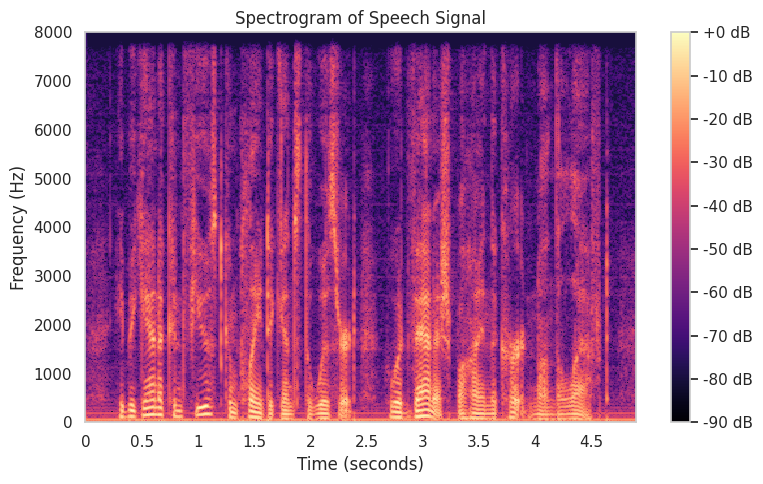

In [79]:
def compute_stft_magnitude(n_fft, hop_length, window, signal):
    
    # Compute the STFT
    # TODO: code me
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length, window=window)
    magnitude_stft = np.abs(stft)
    # Convert the magnitude to decibels
    # TODO: code me
    magnitude_in_db = librosa.amplitude_to_db(magnitude_stft, ref=np.max)
    
    return magnitude_in_db

# Compute the STFT magnitude
# TODO: code me
n_fft = 1024
hop_length = 1024 // 4
window = 'hann'
magnitude_in_db = compute_stft_magnitude(n_fft, hop_length, window, speech)

# Plot the Spectrogram with the specified settings
plt.figure(figsize=(8, 5))
librosa.display.specshow(
    magnitude_in_db,
    sr=sr,
    hop_length=hop_length,
    x_axis='time',
    y_axis='linear',  # Linear frequency scale
    cmap='magma'
)
plt.colorbar(format='%+2.0f dB')
plt.clim(-90, 0)  # Amplitude range in dB
plt.title('Spectrogram of Speech Signal')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 8000)  # Frequency range
plt.tight_layout()
plt.show()

# Male and Female Speech

**Split Male and Female Speech**
* Ensure the original speech files are located under `data/LibriSpeech/`. 
* Create two folders, `data/male/` and `data/female/`, to store male and female speech files.
* Parse `data/LibriSpeech/SPEAKERS.TXT` to create a mapping of speaker IDs to their gender (male or female). The file contains speaker metadata, including gender information, that can be parsed programmatically.
* Traverse the `data/LibriSpeech/` directory to locate `.flac` files.
* For each file, check its speaker ID, and save it in `.wav` format in the appropriate folder (`male/` or `female/`).

In [80]:
# TODO: code me
import os
import soundfile as sf


os.makedirs('data/male/', exist_ok=True)
os.makedirs('data/female/', exist_ok=True)

# Load the SPEAKERS.TXT file to get id
speaker_gender = {}
metadata = 'data/test-clean/LibriSpeech/SPEAKERS.TXT'
with open(metadata, 'r') as f:
    for line in f:
        if line.startswith(';'):
            continue
        parts = line.strip().split('|')
        speaker_id = parts[0].strip()
        gender = parts[1].strip()
        speaker_gender[speaker_id] = gender

# Traverse the LibriSpeech directory to locate .flac files
for root, dirs, files in os.walk('data/test-clean/LibriSpeech/'):
    for file in files:
        if file.endswith('.flac'):
            file_path = os.path.join(root, file)
            speaker_id = root.split('/')[-2]
            gender = speaker_gender.get(speaker_id, None)
            if gender:
                speech, sr = librosa.load(file_path, sr=None)
                target_dir = 'data/male/' if gender == 'M' else 'data/female/'
                target_path = os.path.join(target_dir, os.path.splitext(file)[0] + '.wav')
                sf.write(target_path, speech, sr)

**Male and Female Spectra**
* Spectum data
    * Load a male and female speech files.
    * Compute the spectrum for the male speech signal using `compute_spectrum()` and store the resulting frequencies and magnitudes in `male_frequencies` and `male_magnitudes`.
    * Compute the spectrum for the female speech signal using `compute_spectrum()` and store the resulting frequencies and magnitudes in `female_frequencies` and `female_magnitudes`.
* Plot
    * Create a plot figure with a size of 12x6 using `plt.figure()`.
    * Plot the male speech spectrum with frequencies on the x-axis, magnitudes on the y-axis, and format it with a blue line and transparency (`alpha=0.7`).
    * Plot the female speech spectrum on the same plot, formatted with a red line and transparency (`alpha=0.7`).
    * Set the x-axis to a logarithmic scale using `plt.xscale('log')` for better visualization of frequency ranges.
    * Set the y-axis to a logarithmic scale using `plt.yscale('log')` for better visualization of magnitude ranges.
    * Add a title, axis labels, and a grid to the plot using `plt.title()`, `plt.xlabel()`, `plt.ylabel()`, and `plt.grid()`.
    * Add a legend to distinguish between male and female spectra using `plt.legend()`.
    * Adjust the layout of the plot for better fit using `plt.tight_layout()`.
    * Display the plot using `plt.show()`.

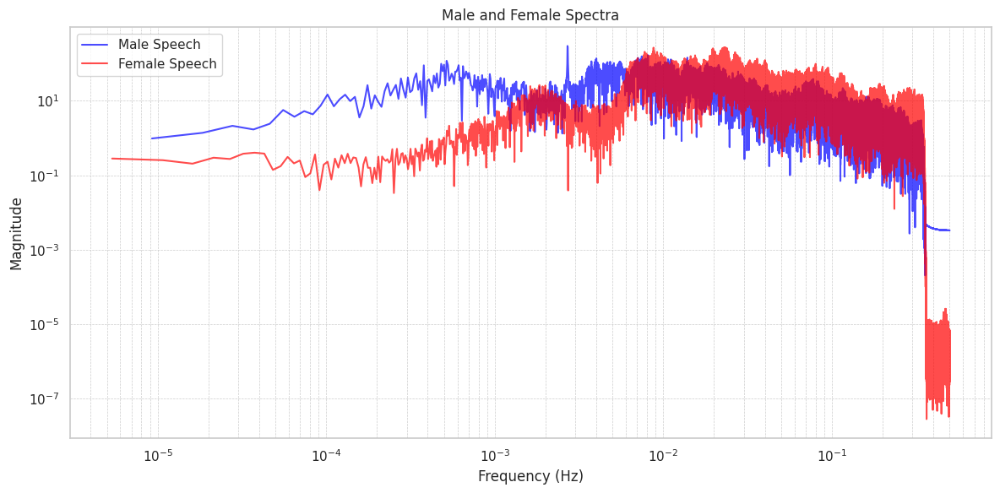

In [ ]:
# Plot Male and Female Spectra
# TODO: code me 
# male 
male_directory = 'data/male/61-70968-0000.wav'

male_speech_file = os.path.join(male_directory)

male_speech, sr = librosa.load(male_speech_file)


female_directory = 'data/female/121-121726-0000.wav' 
female_speech_file = os.path.join(female_directory)
female_speech, sr = librosa.load(female_speech_file)


# # # Compute spectra
# # # TODO: code me
male_frequencies, male_magnitudes = compute_spectrum(male_speech)
female_frequencies, female_magnitudes = compute_spectrum(female_speech)



# Plot the spectra
plt.figure(figsize=(12, 6))
plt.plot(male_frequencies, male_magnitudes, label='Male Speech', color='blue', alpha=0.7)
plt.plot(female_frequencies, female_magnitudes, label='Female Speech', color='red', alpha=0.7)

# Add plot details
plt.xscale('log')  # Logarithmic scale for frequency
plt.yscale('log')  # Logarithmic scale for magnitude
plt.title('Male and Female Spectra')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# Noise

**White Noise (WN)**

A random signal with a flat spectral density, meaning it contains equal power across all frequencies, often resembling a "hissing" sound.

* Define a function generate_white_noise with parameters duration (in seconds) and sampling_rate (in Hz).
* Calculate the total number of samples as $duration \times sampling\_rate$.
* Generate a 1D array of random values from a normal distribution with a mean of 0 and a standard deviation of 1, creating a total of num_samples values.
* Return the generated array as the white noise signal.

In [82]:
def generate_white_noise(duration, sr):
    """
    Generate white noise.
    """
    # Calculate the total number of samples
    # TODO: code me  
    num_samples = duration * sr
    
    # Generate white noise with a normal distribution (mean=0, std=1)
    # TODO: code me 
    white_noise = np.random.normal(0, 1, num_samples) 
    
    return white_noise

Generate and Display a white noise signal, but pay attention to your ear(s).

In [83]:
# TODO: code me  
duration = 9
sr = 22050
white_noise = generate_white_noise(duration, sr)
Audio(white_noise, rate=sr)


Save the white noise in `data/noise/` folder using `soundfile`.

In [84]:
# TODO: code me  
!mkdir -p data/noise

In [85]:
# wrtite to file
white_noise_path = 'data/noise/white_noise.wav'
sf.write(white_noise_path, white_noise, sr)

**Speech-Shaped Noise (SSN)**

A type of noise generated by matching the spectral envelope of a speech signal while randomizing its phase, making it sound like unintelligible speech.

* Define a function `generate_ssn` that takes a 1D NumPy array x (speech signal) as input and returns a 1D array (speech-shaped noise).
* Compute the Fourier transform of the input signal x using `np.fft.rfft()`.
* Generate a random phase using $$e^{2j \pi \cdot r}$$ where $r$ is a random value in [0,1].
* Multiply the magnitude of the Fourier transform by the random phase to create a randomized spectrum.
* Perform an inverse Fourier transform using `np.fft.irfft()` to reconstruct the noise in the time domain.
* Return the real part of the inverse Fourier transform as the generated speech-shaped noise.

In [86]:
def generate_ssn(x):
    stft = np.fft.rfft(x)
    
   
    random_phases = np.exp(2j * np.pi * np.random.rand(len(stft)))
    
    
    randomized_spectrum = np.abs(stft) * random_phases
    
  
    ssn = np.fft.irfft(randomized_spectrum)
    
    # Normalize the SSN to match the RMS amplitude of the original signal
    rms_original = np.sqrt(np.mean(x**2))
    rms_ssn = np.sqrt(np.mean(ssn**2))
    ssn *= rms_original / (rms_ssn + 1e-10)  
    
    return np.real(ssn)


Load a (male/female) speech signal, Generate then Listen to the speech-shaped noise.

In [87]:
# TODO: code me  
male_ssn = generate_ssn(male_speech)
Audio(male_speech, rate=sr)

In [88]:
noise_path = 'data/noise/male_ssn.wav'
sf.write(noise_path, male_ssn, sr)

In [89]:
female_ssn = generate_ssn(female_speech)
Audio(female_speech, rate=sr)

In [90]:
noise_path = 'data/noise/female_ssn.wav'
sf.write(noise_path, female_ssn, sr)

Save the speech-shaped noise in `data/noise/` folder.

In [91]:
# TODO: code me  

**Babble Noise (BN)**

Background noise of overlapping sound of multiple people talking, commonly occurring in real-world environments like busy cafes or crowds.

* Download a babble noise (e.g., crowd sounds) from [freesound](freesound.org) and save it in the `data/noise/` folder.
* Load and display the chosen babble noise. 

In [92]:
# TODO: code me  
babble_noise = 'data/noise/crowd-noise.wav'
babble_speech, sr = librosa.load(babble_noise, sr=None)
Audio(babble_speech, rate=sr)

**Noise Spectra**

Using the `compute_spectrum` function, plot the spectra of white noise, speech-shaped noise, and babble noise, superimposing all three spectra on a single plot for comparison. 

In [93]:
# TODO: code me  
babble_frequencies, babble_magnitudes = compute_spectrum(babble_speech)

In [94]:
ssn = generate_ssn(speech)
ssn_frequencies, ssn_magnitudes = compute_spectrum(ssn)

In [95]:
# white noise
white_noise_freq, white_noise_mag = compute_spectrum(white_noise)

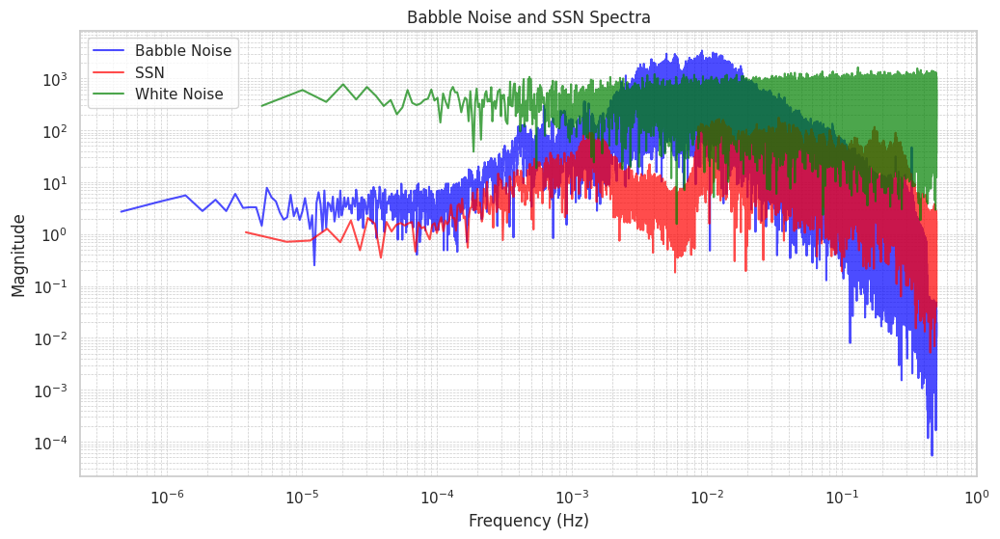

In [96]:
# plot the spectra
plt.figure(figsize=(12, 6))
plt.plot(babble_frequencies, babble_magnitudes, label='Babble Noise', color='blue', alpha=0.7)
plt.plot(ssn_frequencies, ssn_magnitudes, label='SSN', color='red', alpha=0.7)
plt.plot(white_noise_freq, white_noise_mag, label='White Noise', color='green', alpha=0.7)

# Add plot details
plt.xscale('log')  # Logarithmic scale for frequency
plt.yscale('log')  # Logarithmic scale for magnitude
plt.title('Babble Noise and SSN Spectra')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend()

**Noise Spectrograms**

Using the `compute_stft_magnitude` function, create a plot with three subplots arranged in a single row, showcasing the spectrograms of white noise, speech-shaped noise, and babble noise.

In [97]:
# TODO: code me  
babble_mag = compute_stft_magnitude(n_fft, hop_length, window, babble_speech)
ssn_mag = compute_stft_magnitude(n_fft, hop_length, window, ssn)
white_noise_mag = compute_stft_magnitude(n_fft, hop_length, window, white_noise)

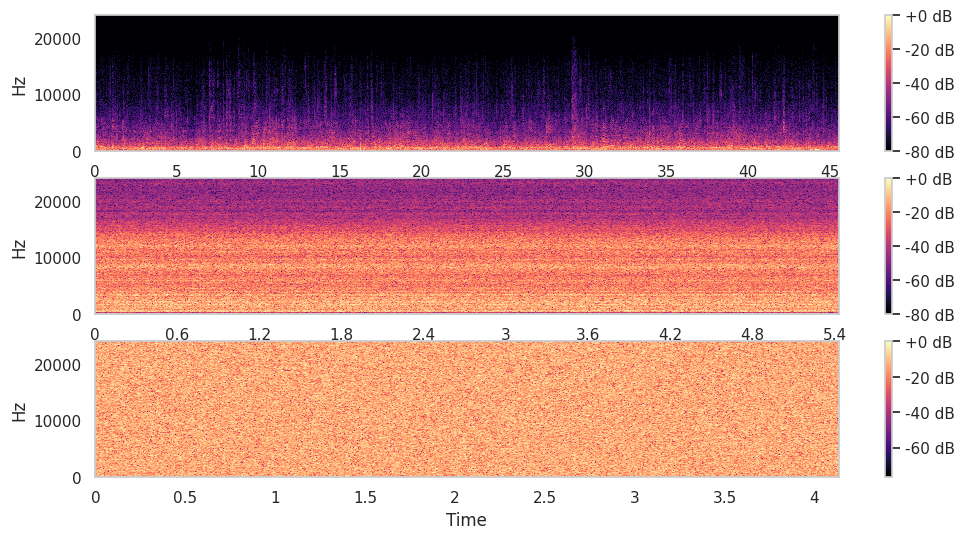

In [98]:
# spectrograms
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
librosa.display.specshow(babble_mag, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear', cmap='magma')
plt.colorbar(format='%+2.0f dB')

plt.subplot(3, 1, 2)
librosa.display.specshow(ssn_mag, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear', cmap='magma')
plt.colorbar(format='%+2.0f dB')

plt.subplot(3, 1, 3)
librosa.display.specshow(white_noise_mag, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear', cmap='magma')
plt.colorbar(format='%+2.0f dB')

**Spectra of Male Speech, Female Speech, and Noise**

Copy your code from **Male and Female Spectra**, and add a noise of your choice.

In [99]:
male_speech_noisy = male_speech + white_noise[:len(male_speech)]
female_speech_noisy = female_speech + white_noise[:len(female_speech)]

Audio(male_speech_noisy, rate=sr)

In [100]:
Audio(female_speech_noisy, rate=sr)

# Creating Mixtures

**Normalization**

$$x_{\text{norm}}(n) = \frac{x(n)}{\max(|x(n)|)}$$

Where:

* $x(n)$: Original speech signal.
* $x_{\text{norm}}(n)$: Normalized speech signal.
* $\max\left(|x(n)|\right)$: The maximum absolute value of the signal $x(n)$.

This ensures the signal amplitude is scaled between $-1$ and $1$.

* Load `data/female/121-121726-0000.wav` and normalize it. 
* Normalize the speech-shaped noise signal. 

In [101]:
# TODO: code me  
# already loaded above
normalised_female = female_ssn / np.max(np.abs(female_ssn))
Audio(normalised_female, rate=sr)

**Create Mixture**

Generating a mixture is the process of combining a clean speech signal $s$ with a noise signal $n$, scaled by a factor $\alpha$, to produce a resulting mixture signal $m$.

$$m = s + \alpha \cdot n$$

Let's create our first mixture.
* Generate a mixture using the formula, setting $\alpha$ to `1`. 
* Play the resulting mixture to hear the combined effect.

In [102]:
# TODO: code me  
female_mixed = female_speech + babble_speech[:len(female_speech)]
Audio(female_mixed, rate=sr)

Generate and Play the mixture with $\alpha$ set to `2`. 

In [103]:
# TODO: code me 
female_mixed = female_speech + 2*(babble_speech[:len(female_speech)])
Audio(female_mixed, rate=sr) 

Generate and Play the mixture with $\alpha$ set to `0.5`. 

In [104]:
# TODO: code me  
female_mixed = female_speech + 0.5*(babble_speech[:len(female_speech)])
Audio(female_mixed, rate=sr) 

**Power**

Power refers to the average energy of a signal over time. For a discrete-time signal, power is calculated as the mean of the squared amplitudes of the signal. It represents the strength or intensity of the signal.

$$P = \frac{1}{N} \sum_{n=1}^{N} x^2(n)$$

* Compute and print the power of the speech.
* Compute and print the power of the noise.

In [105]:
# TODO: code me  
power_speech = np.sum(female_speech ** 2)/len(female_speech)
print(f"The power of the speech signal is {power_speech}")

The power of the speech signal is 0.0026001008227467537


In [106]:
power_babble = np.sum(babble_speech ** 2)/len(babble_speech)
print(f"The power of the babble noise is {power_babble}")

The power of the babble noise is 0.011063004843890667


**Signal-to-Noise Ration (SNR)**

The SNR is a measure that compares the power of a signal (speech or desired audio) to the power of noise present in the same signal. It is expressed in decibels (dB) and is given by:

$$\text{SNR (dB)} = 10 \cdot \log_{10}\left(\frac{P_s}{P_n}\right)$$

- Positive SNR (e.g., SNR = 1):
  - The signal power is greater than the noise power.
  - The speech is relatively clear compared to the noise.

- Zero SNR (SNR = 0):
  - The signal power is equal to the noise power.
  - Both speech and noise are equally loud, making it challenging to separate them.

- Negative SNR (e.g., SNR = -1):
  - The noise power is greater than the signal power.
  - The speech is buried under the noise and becomes difficult to discern.

Compute and print the SNR between the chosen speech and noise.

In [107]:
power_noise = np.sum(white_noise **2)/len(white_noise)
print(f"The power of the white noise signal is {power_noise}")

The power of the white noise signal is 0.9933976922962888


In [108]:
# TODO: code me  
snr = 10 * np.log(power_speech / power_noise)
print(f"The SNR of the speech signal is {snr}")

The SNR of the speech signal is -59.45580857379694


In [109]:
snr = 10 * np.log(power_speech / power_babble)
print(f"The SNR of the speech signal is {snr}")

The SNR of the speech signal is -14.48056411743164


**Compute the Gain**

The parameter $\alpha$ corresponds to the gain, which controls the relative level of the noise $n$ in the mixture.

To create a mixture where the speech and noise are at the same level (SNR=0), we need to determine the appropriate gain $\alpha$ to scale the noise correctly. This gain is calculated using the following formula : 

$$\alpha = \sqrt{\frac{\text{P}_{s}}{\text{P}_{n} \cdot 10^{\frac{\text{SNR}}{10}}}}$$

Compute the gain to achieve the desired SNR of 0 (independent of the previously computed SNR).

In [110]:
# TODO: code me  
alpha = np.sqrt(power_speech / (power_babble*10**(0/10)))
print(f"The scaling factor is {alpha}")

The scaling factor is 0.4847954511642456


**Scale the noise**

Scale the noise signal using the gain calculated in the previous step.

In [111]:
# TODO: code me  
scaled_noise = alpha * babble_speech

**Create the mixture**

In [112]:
# TODO: code me  
female_mixed = female_speech + scaled_noise[:len(female_speech)]
Audio(female_mixed, rate=sr)

In [113]:
power_scaled = np.sum(scaled_noise ** 2)/len(scaled_noise)
print(f"The power of the scaled noise is {power_scaled}")

The power of the scaled noise is 0.0026001008227467537


In [114]:
snr = 10 * np.log(power_speech / power_scaled)
print(snr)

0.0
